In [1]:
import os

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="2"

import sys
sys.path.insert(1, './taming-transformers')

In [2]:
from omegaconf import OmegaConf

import torch
from torch import nn, optim
from torch.nn import functional as F

from taming.models import vqgan
import taming.models

from torchvision.transforms import transforms
from torch.utils.data import DataLoader

from dataset.Vimeo90k import Vimeo90k

import matplotlib.pyplot as plt
import numpy as np

/data/chyuam/miniconda3/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Sample adjacent frames

(1024, 768, 3)


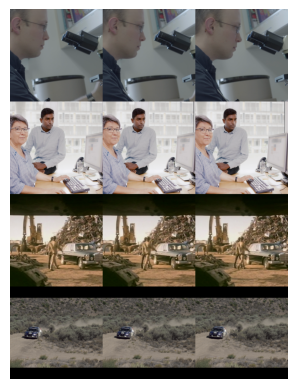

In [3]:
dataset = Vimeo90k(path_to_dataset='../data/vimeo_triplet/sequences', datalist_filename='../data/vimeo_triplet/tri_trainlist.txt')

sample_list = [5000, 25990, 30009, 46789]


for i, idx in enumerate(sample_list):
    im1, im2, im3 = dataset[idx]

    im1 = im1.detach().cpu().numpy().transpose(1, 2, 0)
    im2 = im2.detach().cpu().numpy().transpose(1, 2, 0)
    im3 = im3.detach().cpu().numpy().transpose(1, 2, 0)

    if i == 0:
        im = np.concatenate((im1, im2, im3), axis=1)
    else:
        im_ = np.concatenate((im1, im2, im3), axis=1)
        im = np.concatenate((im, im_), axis=0)


print(im.shape)

plt.imshow(im)
plt.axis("off")
plt.show()

## Sample reconstruction images from VQGAN

In [4]:
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        # transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy()),
        transforms.Lambda(lambda t: np.clip(t, 0, 255).astype(np.uint8)),
        transforms.ToPILImage(mode='RGB'),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))

In [6]:
# config_1024 = OmegaConf.load("model_1024.yaml")
# model_1024 = vqgan.VQModel(**config_1024.model.params)
# model_1024.init_from_ckpt("./last_1024.ckpt")

config_f16_16384 = OmegaConf.load("../configs/model_f16_16384.yaml")
model_f16_16384 = vqgan.VQModel(**config_f16_16384.model.params)
model_f16_16384.init_from_ckpt("../checkpoints/pre-trained/last_f16_16384.ckpt")

model_f16_16384_ft = vqgan.VQModel(**config_f16_16384.model.params)
model_f16_16384_ft.init_from_ckpt("../checkpoints/f16-16384 lr=1e-7/vqgan_epoch_9.pt")

config_f8_256 = OmegaConf.load("../configs/model_f8_256.yaml")
model_f8_256 = vqgan.VQModel(**config_f8_256.model.params)
model_f8_256.init_from_ckpt("../checkpoints/pre-trained/last_f8_256.ckpt")

model_f8_256_ft = vqgan.VQModel(**config_f8_256.model.params)
model_f8_256_ft.init_from_ckpt("../checkpoints/f8-256 lr=1e-7/vqgan_epoch_9.pt")

config_f8_16384 = OmegaConf.load("../configs/model_f8_16384.yaml")
model_f8_16384 = vqgan.VQModel(**config_f8_16384.model.params)
model_f8_16384.init_from_ckpt("../checkpoints/pre-trained/last_f8_16384.ckpt")

model_f8_16384_ft = vqgan.VQModel(**config_f8_16384.model.params)
model_f8_16384_ft.init_from_ckpt("../checkpoints/f8-16384 lr=1e-7/vqgan_epoch_9.pt")



Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/data/chyuam/miniconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data/chyuam/miniconda3/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from ../checkpoints/pre-trained/last_f16_16384.ckpt
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from ../checkpoints/f16-16384 lr=1e-7/vqgan_epoch_9.pt
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from ../checkpoints/pre-trained/last_f8_256.ckpt
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from ../checkpoints/f8-256 lr=1e-7/vqgan_epoch_9.pt
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
loaded pretrained LPI

In [8]:
dataset = Vimeo90k(path_to_dataset='../data/vimeo_triplet/sequences', datalist_filename='../data/vimeo_triplet/tri_trainlist.txt')

imgs = torch.cat((  dataset[5000][0].unsqueeze(0),
                    dataset[25990][0].unsqueeze(0),
                    dataset[30009][0].unsqueeze(0),
                    dataset[46789][0].unsqueeze(0)))

rec_imgs_f16_16384, _ = model_f16_16384.forward(imgs)
rec_imgs_f16_16384 = rec_imgs_f16_16384.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f16_16384 = rec_imgs_f16_16384.reshape((1024, 256, 3))

rec_imgs_f16_16384_ft, _ = model_f16_16384_ft.forward(imgs)
rec_imgs_f16_16384_ft = rec_imgs_f16_16384_ft.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f16_16384_ft = rec_imgs_f16_16384_ft.reshape((1024, 256, 3))

rec_imgs_f8_256, _ = model_f8_256.forward(imgs)
rec_imgs_f8_256 = rec_imgs_f8_256.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f8_256 = rec_imgs_f8_256.reshape((1024, 256, 3))

rec_imgs_f8_256_ft, _ = model_f8_256_ft.forward(imgs)
rec_imgs_f8_256_ft = rec_imgs_f8_256_ft.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f8_256_ft = rec_imgs_f8_256_ft.reshape((1024, 256, 3))

rec_imgs_f8_16384, _ = model_f8_16384.forward(imgs)
rec_imgs_f8_16384 = rec_imgs_f8_16384.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f8_16384 = rec_imgs_f8_16384.reshape((1024, 256, 3))

rec_imgs_f8_16384_ft, _ = model_f8_16384_ft.forward(imgs)
rec_imgs_f8_16384_ft = rec_imgs_f8_16384_ft.detach().cpu().numpy().transpose(0, 2, 3, 1)
rec_imgs_f8_16384_ft = rec_imgs_f8_16384_ft.reshape((1024, 256, 3))

imgs = imgs.detach().cpu().numpy().transpose(0, 2, 3, 1)
imgs = imgs.reshape((1024, 256, 3))

In [17]:
out = np.concatenate((imgs, rec_imgs_f16_16384, rec_imgs_f16_16384_ft, rec_imgs_f8_256, rec_imgs_f8_256_ft, rec_imgs_f8_16384, rec_imgs_f8_16384_ft), axis=1)
print(out.shape)

(1024, 1792, 3)


In [18]:
plt.imshow(out)
plt.axis("off")
plt.rcParams["figure.dpi"] = 3000
plt.rcParams["figure.figsize"] = (120, 120)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
